# Homework 8 - Time Series Analysis

## Goal: Find outliers, trends and periodicity in the MTA turnstile data
###  Data used:
MTA subway fares. It is a complete dataset of rides logged by card swipes for 600 Manhattan stations.

The data was organized by Sina Kashuk at CUSP. It contains 23 different subway card types (e.g. monthly pass, daily pass, Act for Disability pass…) as follows:

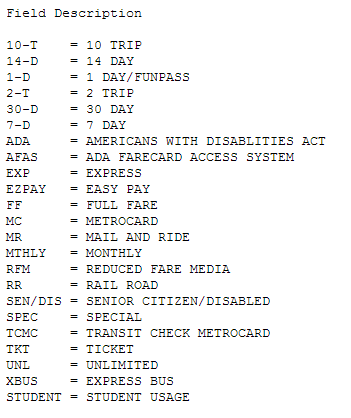

In [1]:
from IPython.display import Image
Image(filename = "Ridetypes.png")

In [2]:
# Load the libraries. 
__author__ = 'Shalmali'

import warnings
import numpy as np
import pandas as pd
from numpy import random
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels as sm
import statsmodels.formula.api as smf
import statsmodels.api as sma
import patsy
from statsmodels.graphics.api import abline_plot
import numpy.linalg as linalg
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
warnings.simplefilter('ignore')
sns.set(context='notebook', style='whitegrid', palette='deep', font='sans-serif', font_scale=1, rc=None)
import pylab as pl
import operator
%pylab inline
#import urllib2 as url
import subprocess

Populating the interactive namespace from numpy and matplotlib


In [3]:
#Read data:
mta = np.load('MTA_Fare.npy')
type (mta)

numpy.ndarray

Each time series (per station, per ticket type) contains the number of swipes per week for 194 weeks from 05/21/2010 to 02/21/2014.
The data is a python data cube. 

In [4]:
mta = np.where(mta !=-1, mta, NaN)
mta.shape

(600, 23, 194)

This is a python numpy array of shape (600,23,194) it means 23 types of ride types, 194- number of weeks in the time series, and 600 stations codes. 
The station codes dont have the actual station names or locations. 

### Task 1:
**Event detection: Identify the most prominent event. There is a very significant drop (>3-sigma) in all time series. Identify it and figure out what it is due to.**

In [5]:
#Sum up all 23 different ridership by stations and time.
mta1 = np.nansum(mta, axis=1, dtype=None, out=None, keepdims=0)
mta1.shape
mta2 = mta1.transpose()
mta2.shape

(194, 600)

In [6]:
#Convert array to a dataframe:
mta_data = pd.DataFrame(mta2)

In [7]:
# Since  per week for 194 weeks from 05/21/2010 to 02/21/2014.
mta_data.index = pd.Index(pd.date_range(
                                pd.to_datetime('05/21/2010'),
                                pd.to_datetime('02/07/2014'),
                                freq='W'
                            ))

In [8]:
mta_data.head(5)

,0,1,2,3,4,5,6,7,8,9,...,590,591,592,593,594,595,596,597,598,599
2010-05-23,126878.0,37306.0,6606.0,16378.0,18564.0,19987.0,12449.0,11091.0,10482.0,147187.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-05-30,149477.0,46464.0,6881.0,17408.0,19903.0,20625.0,13644.0,11659.0,11030.0,154826.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-06-06,152383.0,49359.0,7229.0,17595.0,19948.0,21225.0,13719.0,12037.0,10881.0,155958.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-06-13,160175.0,44849.0,5731.0,14242.0,16076.0,17412.0,11460.0,9809.0,9123.0,154914.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-06-20,162641.0,41509.0,7032.0,17589.0,20283.0,20909.0,14094.0,11944.0,10923.0,157628.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Exploratory stage 

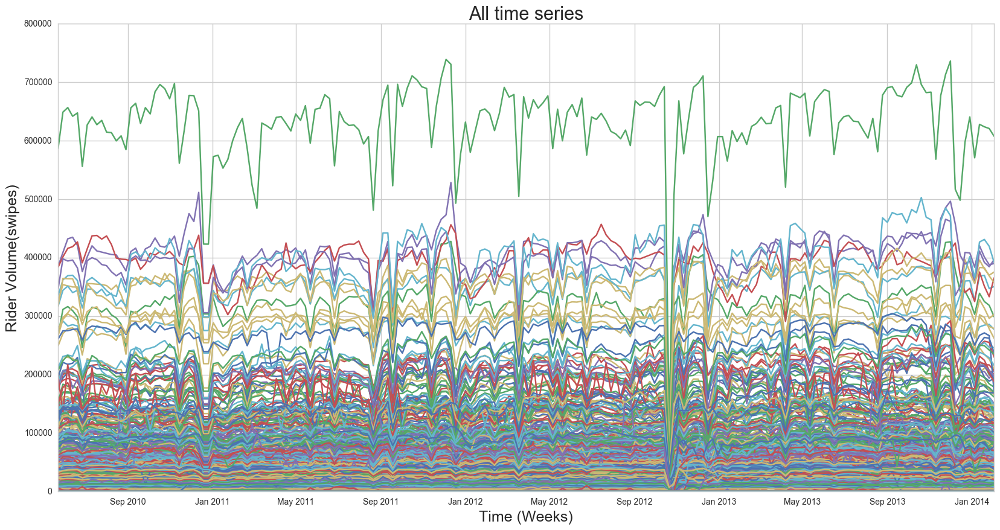

In [9]:
plt.figure(figsize=(20,10))
pl.plot(mta_data.index, mta_data) 
pl.ylabel("Rider Volume(swipes)", fontsize=18)
pl.xlabel("Time (Weeks)", fontsize=18)
pl.title("All time series", fontsize=22)

## Figure 1: All time series in the dataset. The plot is not insightful to interpret. 

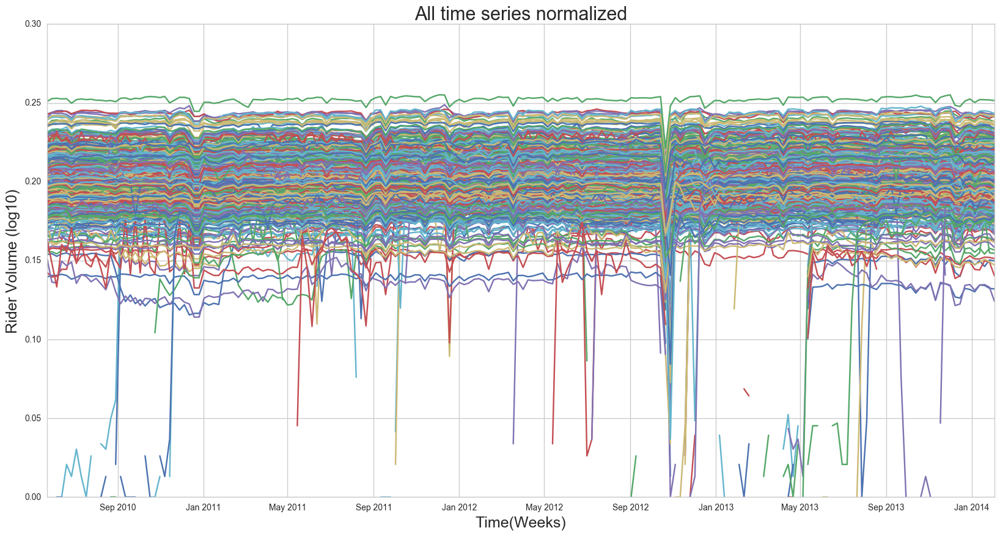

In [10]:
plt.figure(figsize=(20,10))
pl.plot(mta_data.index, np.log10(mta_data)/23) 
pl.ylabel("Rider Volume (log10)", fontsize=18)
pl.xlabel("Time(Weeks)", fontsize=18)
pl.title("All time series normalized", fontsize=22)

### Figure 2: All the time series normalised and the rider volume in log space. In this plot there emerges certain prominent drops for few time series.

In [11]:
#Sum all the ridership from 600 stations in one time-series.
mta3 = np.nansum(mta2, axis=1, dtype=None, out=None, keepdims=0)
mta3.shape
#Convert array to a dataframe:
mta_data3 = pd.DataFrame(mta3)

# Since  per week for 194 weeks from 05/21/2010 to 02/21/2014.
mta_data3.index = pd.Index(pd.date_range(
                                pd.to_datetime('05/21/2010'),
                                pd.to_datetime('02/07/2014'),
                                freq='W'
                            ))

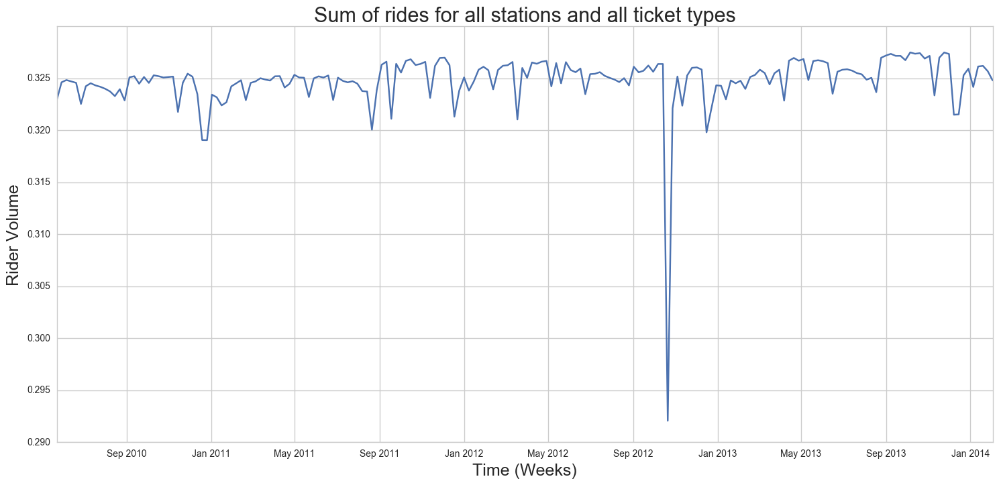

In [12]:
plt.figure(figsize=(18,8))
pl.plot(mta_data3.index, np.log10(mta_data3)/23)
pl.ylabel("Rider Volume", fontsize=18)
pl.xlabel("Time (Weeks)", fontsize=18)
pl.title("Sum of rides for all stations and all ticket types", fontsize=22)

### Figure 3: Rider Volume (log10) against weeks with sum of all rides. This plot shows prominent drops. 

#### The mean and stardand deviation of the time series can be used to set a 3-sigma threshold. Every value that is more then 3 sigma's away from the mean can be flaged as an event

In [13]:
print ('The mean of the time series is : ', mta_data3[0].mean())
print ('The standard deviation is :', mta_data3[0].std())
thresholds = [mta_data3[0].mean() + 3*mta_data3[0].std(), 
              mta_data3[0].mean() - 3*mta_data3[0].std()]
print ('The 3-sigma thresholds are:', thresholds)

The mean of the time series is :  29781349.87113402
The standard deviation is : 2991680.90141395
The 3-sigma thresholds are: [38756392.57537587, 20806307.16689217]


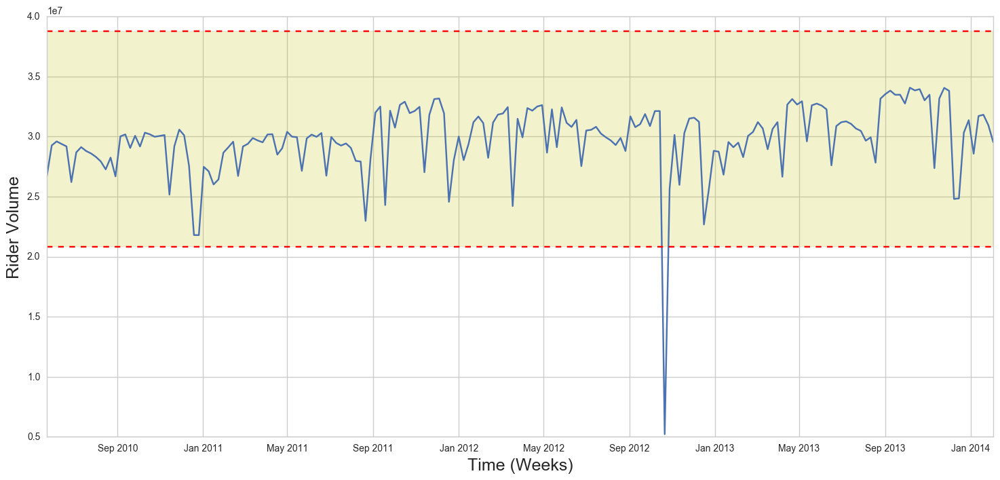

In [14]:
plt.figure(figsize=(18,8))

ax = pl.plot(mta_data3.index, mta_data3)
pl.ylabel("Rider Volume", fontsize=18)
pl.xlabel("Time (Weeks)", fontsize=18)
pl.fill_between(mta_data3.index, thresholds[0], thresholds[1], facecolor='y', alpha=0.2, label="3-sigma threshold")
plt.axhline(thresholds[0], color='r', linestyle='--')
plt.axhline(thresholds[1], color='r', linestyle='--')

### Figure 3b: Rider Volume with the 3-sigma threshold lines. 

## Notice there is a significant drop between Sep 2012 and Jan 2013. That is Hurrican Sandy which is from Oct. 21 to Oct.31 2012.

In [15]:
#Check the exact date of 126th week
print ('The date of signficant drop with 3-sigma threshold is: ', mta_data3.index[126])

The date of signficant drop with 3-sigma threshold is:  2012-10-21 00:00:00


### The Hurricane Sandy event showing the significant drop in ridership volume which hit NYC on Oct 28-29 2012.
So it looks like the guess of time series start date should be 05/28/2012 instead of 05/21/2012. 
I can recreate the date range starting 1 week later the supposed start date. 

In [16]:
rng = pd.date_range('05/28/2010', periods=194, freq='W')
rng = pd.DataFrame(rng)
print ('The date of signficant drop with 3-sigma threshold is: ', rng.loc[126])

The date of signficant drop with 3-sigma threshold is:  0   2012-10-28
Name: 126, dtype: datetime64[ns]


## The significant drop with 3 -sigma threshols occured on October 28 which is when Hurricane Sandy hit NYC.

## Task 2:
**Some of the time series are stationary, some have a complex structure, some show a downward trend: Identify the ridership types that have steadily increased in popularity, and that have steadily decreased. by how much? (e.g what is the ratio of usage in the first 10 and last 10 weeks)**

In [17]:
from __future__ import print_function
import numpy as np
from scipy import stats
import pylab as pl

import matplotlib
%matplotlib nbagg
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [18]:
#Sum up all 23 different ridership by stations and time.
ridetype = ['10t', '14d', '1d', '2t', '30d', '7d', 'ada', 'afas', 'exp','ez',
            'ff','mc','mr','month','rfm','rr','sen','spec','tcmc','t',
            'umlim','xbus','stud']
mta4 = np.nanmean(mta, axis=0, dtype=None, out=None, keepdims=0)
mta4 = mta4.transpose()
mta4.shape

(194, 23)

In [19]:
#Convert array to a dataframe:
mta_data4 = pd.DataFrame(mta4)
# Since  per week for 194 weeks from 05/28/2010 to 02/21/2014.
mta_data4.index = pd.Index(pd.date_range(
                                pd.to_datetime('05/21/2010'),
                                pd.to_datetime('02/07/2014'),
                                freq='W'
                            ))

In [20]:
mta_data4.columns = ridetype
mta_data4[:5]

,10t,14d,1d,2t,30d,7d,ada,afas,exp,ez,...,month,rfm,rr,sen,spec,tcmc,t,umlim,xbus,stud
2010-05-23,24880.119048,1148.320346,103.465368,403.790043,101.316017,8003.123377,18510.686147,21.781385,721.205628,1108.294372,...,266.523810,1710.194805,129.456710,61.084416,0.00000,269.898268,45.584416,13.264069,0.774892,NaN
2010-05-30,27173.229935,1265.798265,111.683297,432.167028,139.594360,8637.327549,20577.861171,25.698482,613.351410,1253.845987,...,329.605206,1969.778742,150.127983,70.136659,0.00000,264.019523,47.006508,13.275488,1.028200,NaN
2010-06-06,27573.708423,1266.077754,111.524838,431.248380,123.097192,8710.647948,20467.684665,26.516199,652.328294,1329.453564,...,327.295896,1974.349892,150.267819,70.449244,0.00000,263.889849,46.291577,14.017279,1.004320,NaN
2010-06-13,27329.751620,1215.123110,112.447084,424.166307,80.840173,8710.049676,20410.542117,24.235421,659.855292,1309.438445,...,317.697624,1949.349892,147.082073,69.987041,0.00000,263.609071,46.717063,14.233261,1.045356,NaN
2010-06-20,27607.099138,1182.883621,110.243534,420.006466,75.883621,8460.012931,20030.176724,22.661638,723.663793,1214.323276,...,297.172414,1843.907328,143.053879,68.821121,0.37931,258.137931,43.743534,13.605603,0.974138,NaN


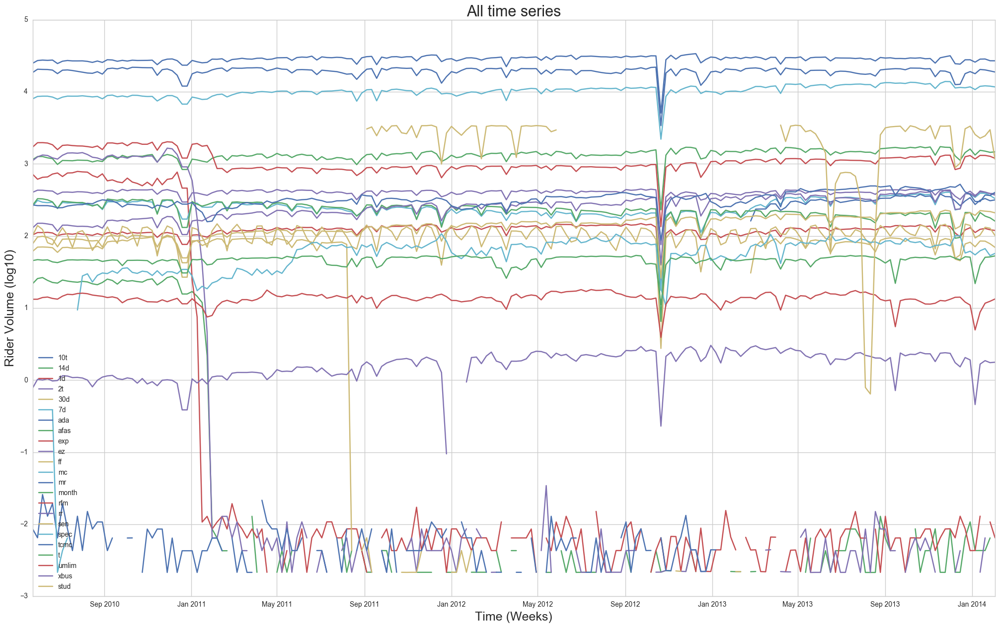

In [21]:
plt.figure(figsize=(25,15))
pl.plot(mta_data4.index, np.log10(mta_data4)) 
pl.ylabel("Rider Volume (log10)", fontsize=18)
pl.xlabel("Time (Weeks)", fontsize=18)
pl.legend(mta_data4.columns, loc='best')
pl.title("All time series", fontsize= 22)

## Figure 4: Rider volume (log 10) aginst time in weeks.

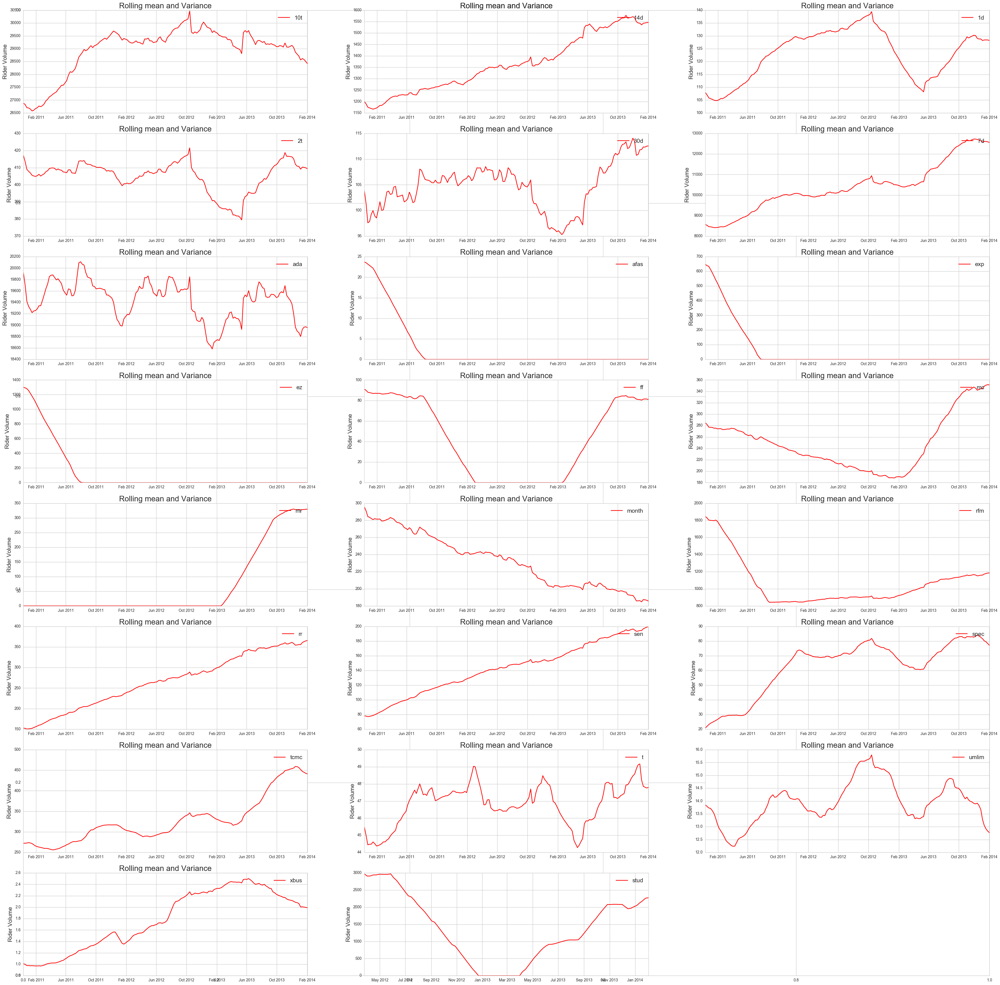

In [22]:
#pd.rolling_mean(mta_data4, window=2, min_periods=None, freq=None, center=False, how=None)
fig = plt.figure(figsize=(45,45)) 
x = 1

for i in ridetype:
    plt.title('Rolling mean and Variance',fontsize = 20)
    mean1 = pd.rolling_mean(mta_data4[i], 30)
    ax = fig.add_subplot(8,3,x)
    ax.plot(mta_data4.index, mean1, 'r')
    pl.ylabel("Rider Volume", fontsize=15)
    #pl.xlabel("Week", fontsize=15)
    pl.legend([i], fontsize = 15)
    x = x+1  

## Figure 5: Rolling Mean for each of 23 rider types. 
The plots shows visually the increasing or decreasing trends for the rider types. 

It can be seen that 14 day, 7 day, railroad, senior, special, transitcheck metrocard and expressbus have upward trends whereas monthly passes have a downward trend. 

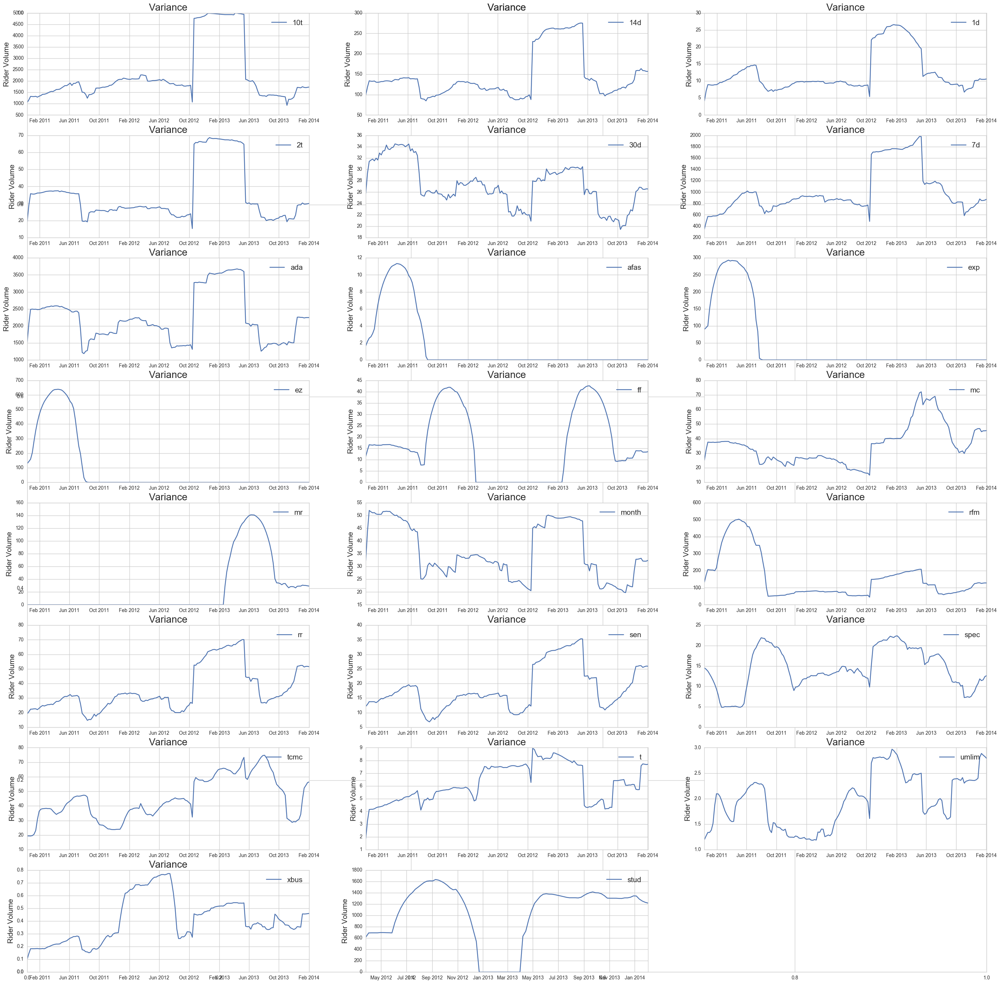

In [23]:
fig = plt.figure(figsize=(35,35)) 
x = 1

for i in ridetype:
    plt.title('Variance',fontsize = 20)
    std1 = pd.rolling_std(mta_data4[i], 30)
    ax = fig.add_subplot(8,3,x)
    ax.plot(mta_data4.index,std1)
    pl.ylabel("Rider Volume", fontsize=15)
    #pl.xlabel("Week", fontsize=15)
    pl.legend([i], fontsize = 15)
    x = x+1  

## Figure 6: Rolling Variance for all the 23 ride types
This plot confirms the same trends with rolling mean. 

Visually based on the plots above, we can tell that there are trends in certain rider types:

**Increasing** population for 7-day pass('7d'), 14-day pass('14d'), Rail Road('rr'), and Senior Citizen ('sen')
On the other hand, there is a **decreasing** trend of Monthly Rider ('month').

 We will use our array of ratios above to see how upward or downwards.

In [24]:
smoothrides = np.empty_like(mta[0])
countratio = np.zeros(len(mta[0]), float)
for i in range(mta.shape[1]):
    mta_allsum = mta[:,i,:]
    
    #rolling mean to smooth structure on short time scales and summing over all stations
    smoothrides[i] = pd.rolling_mean(np.nansum(mta_allsum, axis=0), 10)
    countratio[i] = np.nanmean(smoothrides[i][:10])/np.nanmean(smoothrides[i][-10:])
    print ('%10s rider type \t ratio of %s \t standard deviation %s' \
           %(ridetype[i],countratio[i],np.nanstd(smoothrides[i])))

       10t rider type 	 ratio of 0.951681784403 	 standard deviation 546777.616992
       14d rider type 	 ratio of 0.753056693835 	 standard deviation 64593.9013999
        1d rider type 	 ratio of 0.854224343773 	 standard deviation 5767.41249418
        2t rider type 	 ratio of 1.02775863514 	 standard deviation 8828.00385607
       30d rider type 	 ratio of 0.93477935432 	 standard deviation 3624.08852559
        7d rider type 	 ratio of 0.685982250186 	 standard deviation 631955.017784
       ada rider type 	 ratio of 1.08592961275 	 standard deviation 473487.373171
      afas rider type 	 ratio of 4924.34977578 	 standard deviation 3794.92677395
       exp rider type 	 ratio of 94109.1091954 	 standard deviation 101444.891854
        ez rider type 	 ratio of 503545.12605 	 standard deviation 206370.776156
        ff rider type 	 ratio of 1.15498991569 	 standard deviation 18800.9465287
        mc rider type 	 ratio of 0.812339682807 	 standard deviation 25371.3235538
        mr r

### Senior passes have a steady increased in usage over the period considered
### Monthly passes have steadily decreased in usage over the period considered

## Task 3:
Several stations show a prominent annual periodicity. Identify the 4 stations (indentify them by the index of their location in the data cube) that show the most prominent periodic trend on an annual period (52 weeks). (Can you figure out what the periodic peak in rides is due to?)

In this case we need to create 600 stations' time series with a period of 52 weeks.

In [25]:
from datetime import datetime
import calendar 

In [26]:
#In this case we look at the day with 600 stations in 194 weeks:
mta_data.head(3)

,0,1,2,3,4,5,6,7,8,9,...,590,591,592,593,594,595,596,597,598,599
2010-05-23,126878.0,37306.0,6606.0,16378.0,18564.0,19987.0,12449.0,11091.0,10482.0,147187.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-05-30,149477.0,46464.0,6881.0,17408.0,19903.0,20625.0,13644.0,11659.0,11030.0,154826.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-06-06,152383.0,49359.0,7229.0,17595.0,19948.0,21225.0,13719.0,12037.0,10881.0,155958.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
freq = 1
period = 52*freq
sample_rate = 1
duration = 194
N = duration * sample_rate

The absolute value of the fourier transform are used for the real frequencies (real = positive). 
Only the real frequencies by using the **np.rfft function (instead of np.fft)**

The real part of the Fourier transform is obtained by using the absolute value of the fourier transform or take the square of the fourier transforms of the real frequencies (positive) By doing so the complex part of the fourier transform is removed.   

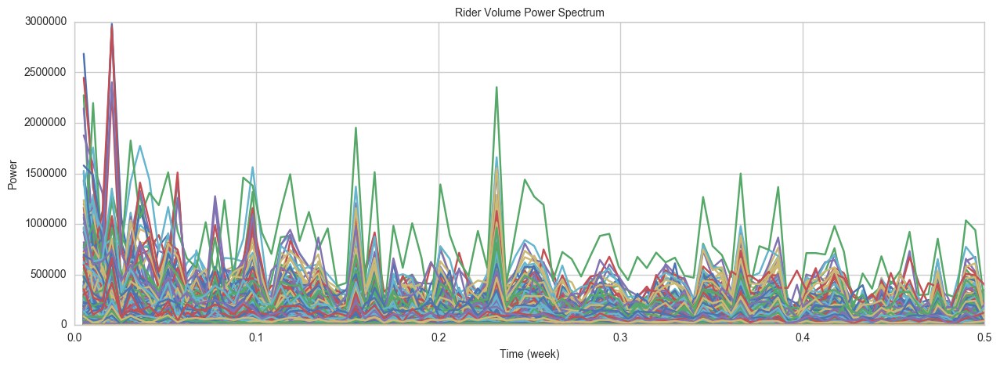

In [28]:
fig=pl.figure(figsize=(15,5))
ax=fig.add_subplot(111)

m = np.arange(0, 599, 1)
for i in m:
    f = np.abs(np.fft.rfft(mta_data[i]))
    #print (1.0/np.fft.rfftfreq(N, 1.0)[0:2])
    #print (1.0/np.fft.rfftfreq(N, 1.0)[-3:-1])
    #ax.plot(np.fft.rfftfreq(N, 1.0)[1:], (f[1:]), 'o', ms=5, alpha = .5)
    ax.plot(np.fft.rfftfreq(N, 1.0)[1:], (f[1:]), '-')
    #ax.set_xticklabels([ "%s"% f for f in ax.get_xticks()], fontsize=10)
    pl.xlabel("Time (week)", fontsize=10)
    pl.ylabel("Power", fontsize=10)
    pl.title("Rider Volume Power Spectrum", fontsize=10)
    pl.legend(fontsize = 5)

### Figure 7: Rider Volume Power Spectrum 

In [29]:
print ("periods where the Power is calculated: \n", 1.0/np.fft.rfftfreq(N, 1.0)[1:])

periods where the Power is calculated: 
 [ 194.           97.           64.66666667   48.5          38.8
   32.33333333   27.71428571   24.25         21.55555556   19.4
   17.63636364   16.16666667   14.92307692   13.85714286   12.93333333
   12.125        11.41176471   10.77777778   10.21052632    9.7
    9.23809524    8.81818182    8.43478261    8.08333333    7.76
    7.46153846    7.18518519    6.92857143    6.68965517    6.46666667
    6.25806452    6.0625        5.87878788    5.70588235    5.54285714
    5.38888889    5.24324324    5.10526316    4.97435897    4.85
    4.73170732    4.61904762    4.51162791    4.40909091    4.31111111
    4.2173913     4.12765957    4.04166667    3.95918367    3.88
    3.80392157    3.73076923    3.66037736    3.59259259    3.52727273
    3.46428571    3.40350877    3.34482759    3.28813559    3.23333333
    3.18032787    3.12903226    3.07936508    3.03125       2.98461538
    2.93939394    2.89552239    2.85294118    2.8115942     2.77142857
    

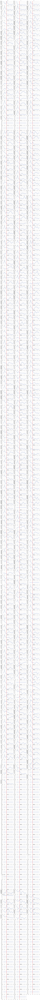

In [30]:
#Now we want to check the power spectrum by each station.
fig = plt.figure(figsize=(15,400)) 
x = 1

for i in range(0,599):
    f = np.abs(np.fft.rfft(mta_data[i]))
    ax = fig.add_subplot(200,3,x)
    ax.plot(np.fft.rfftfreq(N, 1.0)[1:], (f[1:]), '-')
    ax.plot(np.fft.rfftfreq(N, 1.0)[1:], (f[1:]), 'o', ms=4, color = 'blue',alpha=.5)
    plt.axvline(1.0/52, color='r', linestyle='-')
    pl.xlim (0,0.05)
    #pl.xlabel("period", fontsize=5)
    #pl.ylabel("Power", fontsize=5)
    pl.title(i, fontsize=15)
    #pl.legend([i], fontsize = 8)
    x = x+1 

### Figure 8: All 600 stations plotted 
The stations with the highest yearly periodicity are 0, 150, 194 and  327 (visually). These stations have values between 2.5 and 3 million in the power spectrums plotted above. The higher the value of the power spectrum at a given period, the higher the periodicity of that station at that time.

In [31]:
mta_data5 = pd.DataFrame(mta1)
p = {}
for i in range(600):
    p[i] = np.abs(np.fft.rfft(mta_data5.loc[i,:]))[4]
    
dict(sorted(p.items(), key = operator.itemgetter(1), reverse = True)[:4])

{0: 2980160.6355953491,
 150: 2931895.8769513383,
 194: 2950388.929214194,
 327: 2402218.5809588572}

## Extra Credit Attempt

**KMeans Clustering**
I used the code from Dr. Frderica's intrustions. 

In [43]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score  # was trying to find the no. of clusters.

mta_data = np.load("MTA_Fare.npy")
totals = mta_data.transpose(2,0,1).reshape(mta_data.shape[2], mta_data.shape[1]*mta_data.shape[0]).T
tots = totals[totals.std(1)>0]

#10 number of clusters selected arbitarily.
km = KMeans(n_clusters=10, random_state=555)
vals = ((tots.T - tots.mean(1))/tots.std(1)).T
km.fit(vals)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=555, tol=0.0001, verbose=0)

In [44]:
# print labels of 10 clusters
km.labels_

array([6, 6, 6, ..., 3, 7, 3], dtype=int32)

Distance can be calculated using ** cluster_ centers_ ** and is plotted against the transformed numpy array.
Here I am just rtrying to understand the cluster centers and distances. 

For further analysis metadata would be require. 

In [45]:
distance = (np.array([vals - km.cluster_centers_[i] for i in range (len(km.cluster_centers_))])**2)

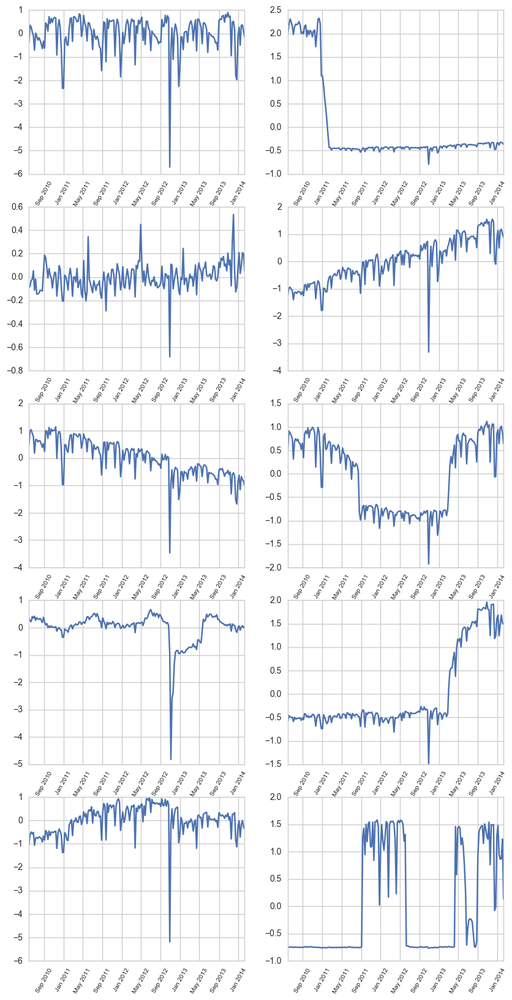

In [46]:
fig = pl.figure(figsize = (10,20))
for i,Xc in enumerate(km.cluster_centers_):
    ax = fig.add_subplot(5,2,(i+1))
    ax.plot(rng, Xc)
    pl.xticks(rotation = 60, fontsize = 7.5)

### Figure 9: Cluster centers and time series.
All the given 23 types of rider tickets are clustered into 10 clusters. 
Further data would be require to interept these clusters and trends plotted in the above plot.